<a href="https://colab.research.google.com/github/ZahraAlharz/Oxford-AI-Summer-School/blob/main/CGANs_Arcitecture_HW_CV_Oxford.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Implement a Conditional GAN for Attribute-Based Image Generation on CelebA

The objective of this assignment is to develop and train a Conditional Generative Adversarial Network (cGAN) model. This cGAN will be specifically designed to generate realistic facial images from the CelebA dataset, conditioned on eight key attributes:

1. Eyeglasses
2. Wearing a Hat
3. Bangs
4. Wavy Hair
5. Pointy Nose
6. Mustache
6. Oval Face
8. Smiling


Important Note: The CelebA dataset contains 40 different facial attributes. For this assignment, you will focus solely on training your cGAN to generate images based on the eight attributes listed above.


!["CelebA"](https://mmlab.ie.cuhk.edu.hk/projects/CelebA/overview.png)



##Dataset:
CelebFaces Attributes Dataset (CelebA) is a large-scale face attributes dataset with more than 200K celebrity images, each with 40 attribute annotations. The images in this dataset cover large pose variations and background clutter. CelebA has large diversities, large quantities, and rich annotations, including



*   10,177 number of identities,
*   202,599 number of face images, and
*   5 landmark locations, 40 binary attributes annotations per image.


In [ ]:
# Setup of the folder structure, following the guide:
# https://medium.com/@opalkabert/downloading-kaggle-datasets-into-google-colab-fb9654c94235
!pip install -U -q kaggle

# !mkdir -p ~/.kaggle

# from google.colab import files
# files.upload()

# !cp kaggle.json ~/.kaggle/

!kaggle datasets download -d jessicali9530/celeba-dataset
!ls

!cd /content
!mkdir ./celeba
!unzip /content/celeba-dataset.zip -d /content/celeba

!mkdir /content/celeba/img_align_celeba/
!unzip -q /content/celeba/img_align_celeba.zip -d /content/celeba/img_align_celeba/

!cp /content/celeba/list_attr_celeba.csv /content/celeba/img_align_celeba/img_align_celeba/list_attr_celeba.csv

Streaming output truncated to the last 5000 lines.
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197606.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197607.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197608.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197609.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197610.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197611.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197612.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197613.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197614.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197615.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197616.jpg  
  inflating: /content/celeba/img_align_celeba/img_align_celeba/197617.jpg  
  inflating: /content/celeba/img_alig

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202594,202595.jpg,-1,-1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
202595,202596.jpg,-1,-1,-1,-1,-1,1,1,-1,-1,...,-1,1,1,-1,-1,-1,-1,-1,-1,1
202596,202597.jpg,-1,-1,-1,-1,-1,-1,-1,-1,1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
202597,202598.jpg,-1,1,1,-1,-1,-1,1,-1,1,...,-1,1,-1,1,1,-1,1,-1,-1,1


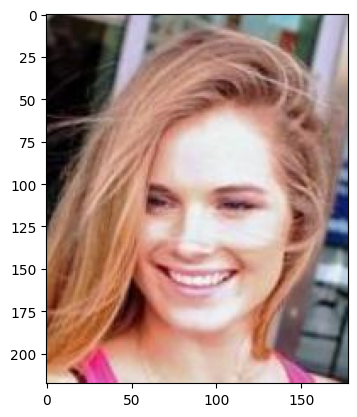

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd

path = '/content/celeba/img_align_celeba/img_align_celeba/001901.jpg'
img = mpimg.imread(path)
imgplot = plt.imshow(img)
pd.read_csv('/content/celeba/img_align_celeba/img_align_celeba/list_attr_celeba.csv')


In [ ]:
#Conncect Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Library Import

from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image
import pandas as pd
from PIL import Image

In [ ]:
# Define constants
batch_size = 64
num_epochs = 2
input_dir = '/content/celeba/img_align_celeba/img_align_celeba/'
output_dir = '/content/gdrive/My Drive/'
csv_name = 'list_attr_celeba.csv'
num_workers = 2
image_size = 64
ngpu = 1
g_input_dim = 100 # Latent Space
n_channels = 3
lr = 0.0002
beta1 = 0.5
visualization_step = 300
n_labels = 2
labels_number = [21,9] # Labels numers - 21: Male/Female, 9: Black hair/non Black hair
#,23,26,28,32,34,36
# 16 eyeglasses,23 mustach,26 0val face, 34 wavy, 36 hat, 6 bangs, 28 pointy nose, 32 smiling

ngf = 64  # Size of feature maps in generator
ndf = 64  # Size of feature maps in discriminator

In [ ]:
class MyCustomDataset(torch.utils.data.Dataset):

    def __init__(self, input_dir, csv_name, image_size, labels_number):

        self.transform_to_apply = transforms.Compose([
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))]) #  pixel values in the range [-1, 1]

        # Read the csv file
        self.data_info = pd.read_csv(os.path.join(input_dir,csv_name))

        # First column contains the image paths, second column is the labels
        self.image_arr = np.asarray(self.data_info.iloc[:, 0])

        # Create the temporary array with the labels specified, initialize it at random
        temp_labels = np.random.rand(self.image_arr.shape[0], len(labels_number))

        # For every label that we want to use we load the corresponding csv coloumn in the temporary variable
        for i in range(len(labels_number)):
            temp_labels[0:-1,i] = (self.data_info.iloc[0:-1, labels_number[i] ] )

        # Defenetively save the labels array, that will contains only the interesting labels
        self.label_arr = np.asarray(temp_labels)

        # Calculate lenght of the dataset
        self.data_len = len(self.data_info.index)


    # __getitem__ function returns the data and labels. This function is called from dataloader
    def __getitem__(self, index):

        # Get image name from the pandas df
        single_image_name = self.image_arr[index]

        # Open image and apply the transformation
        img_as_img = Image.open(os.path.join(input_dir,single_image_name))
        img = self.transform_to_apply(img_as_img)

        # Get the labels of the image based on the cropped pandas column
        single_image_label = self.label_arr[index]

        # convert labels 1 and 0 instead of 1 and -1
        for i in range (single_image_label.size):
            if single_image_label[i] < 0:
                single_image_label[i] = 0

        return (img, single_image_label)

    def __len__(self):
        return self.data_len

In [ ]:
dataset = MyCustomDataset(input_dir,csv_name,image_size,labels_number)

data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, drop_last=True)

In [ ]:
for x,y in data_loader:
  print(x.shape)
  print(y.shape)
  break

torch.Size([64, 3, 64, 64])
torch.Size([64, 2])


In [ ]:
y[0]

tensor([0., 1.], dtype=torch.float64)

In [ ]:
class Generator(nn.Module):
    # initializers
    def __init__(self, d=128): # d= number of feature maps
        super(Generator, self).__init__()
        self.deconv1_1 = nn.ConvTranspose2d(100, d*4, 4, 1, 0)
        self.deconv1_1_bn = nn.BatchNorm2d(d*4)
        self.deconv1_2 = nn.ConvTranspose2d(n_labels*2, d*4, 4, 1, 0)
        self.deconv1_2_bn = nn.BatchNorm2d(d*4)
        self.deconv2 = nn.ConvTranspose2d(d*8, d*4, 4, 2, 1)
        self.deconv2_bn = nn.BatchNorm2d(d*4)
        self.deconv3 = nn.ConvTranspose2d(d*4, d*2, 4, 2, 1)
        self.deconv3_bn = nn.BatchNorm2d(d*2)
        self.deconv4 = nn.ConvTranspose2d(d*2, d, 4, 2, 1)
        self.deconv4_bn = nn.BatchNorm2d(d)
        self.deconv5 = nn.ConvTranspose2d(d, 3, 4, 2, 1)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    # def forward(self, input):
    def forward(self, input, label):
        x = F.leaky_relu(self.deconv1_1_bn(self.deconv1_1(input)), 0.2)
        y = F.leaky_relu(self.deconv1_2_bn(self.deconv1_2(label)), 0.2)
        x = torch.cat([x, y], 1)
        x = F.leaky_relu(self.deconv2_bn(self.deconv2(x)), 0.2)
        x = F.leaky_relu(self.deconv3_bn(self.deconv3(x)), 0.2)
        x = F.leaky_relu(self.deconv4_bn(self.deconv4(x)), 0.2)
        x = torch.tanh(self.deconv5(x))

        return x

class Discriminator(nn.Module):
    # initializers
    def __init__(self, d=128):
        super(Discriminator, self).__init__()
        self.conv1_1 = nn.Conv2d(3, int(d/2), 4, 2, 1)
        self.conv1_2 = nn.Conv2d(n_labels*2, int(d/2), 4, 2, 1)
        self.conv2 = nn.Conv2d(d, d*2, 4, 2, 1)
        self.conv2_bn = nn.BatchNorm2d(d*2)
        self.conv3 = nn.Conv2d(d*2, d*4, 4, 2, 1)
        self.conv3_bn = nn.BatchNorm2d(d*4)
        self.conv4 = nn.Conv2d(d*4, d*8, 4, 2, 1)
        self.conv4_bn = nn.BatchNorm2d(d*8)
        self.conv5 = nn.Conv2d(d*8, 1, 4, 1, 0)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    # def forward(self, input):
    def forward(self, input, label):
        x = F.leaky_relu(self.conv1_1(input), 0.2)
        y = F.leaky_relu(self.conv1_2(label), 0.2)
        x = torch.cat([x, y], 1)
        x = F.leaky_relu(self.conv2_bn(self.conv2(x)), 0.2)
        x = F.leaky_relu(self.conv3_bn(self.conv3(x)), 0.2)
        x = F.leaky_relu(self.conv4_bn(self.conv4(x)), 0.2)
        x = torch.sigmoid(self.conv5(x))

        return x

In [ ]:
def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

# function to get the labels as tensor for the discriminator from the real labels in a vector
def getDiscriminatorLabels(lbl, batch_size, image_size):

    if(lbl.shape[1] == 1):

        a = torch.zeros([batch_size,2,image_size,image_size])

        for i in range(batch_size):
            if lbl[i][0] == 1:
                a[i,0,:,:] = 1
            else :
                a[i,1,:,:] = 1

        return a

    elif (lbl.shape[1] == 2):

        a = torch.zeros([batch_size,4,image_size,image_size])

        for i in range(batch_size):
          if lbl[i][0] == 1:
                a[i,0,:,:] = 1
          else :
                a[i,1,:,:] = 1
          if lbl[i][1] == 1:
                a[i,2,:,:] = 1
          else :
                a[i,3,:,:] = 1

        return a

    else:
        a = torch.zeros([batch_size,6,image_size,image_size])

        for i in range(batch_size):
          if lbl[i][0] == 1:
                a[i,0,:,:] = 1
          else :
                a[i,1,:,:] = 1
          if lbl[i][1] == 1:
                a[i,2,:,:] = 1
          else :
                a[i,3,:,:] = 1
          if lbl[i][2] == 1:
                a[i,4,:,:] = 1
          else :
                a[i,5,:,:] = 1

        return a

# function to get the labels as tensor for the generator from the random labels in a vector
def getGeneratorLabels(lbl,batch_size):

    if(lbl.shape[1] == 1) :

        a = torch.zeros([batch_size,2,1,1])

        for i in range(batch_size):
            if lbl[i][0] == 1:
                a[i,1,0,0] = 1
            else:
                a[i,0,0,0] = 1

        return a

    elif(lbl.shape[1] == 2):
        a = torch.zeros([batch_size,4,1,1])

        for i in range(batch_size):
            if lbl[i][0] == 1:
                a[i,1,0,0] = 1
            else:
                a[i,0,0,0] = 1
            if lbl[i][1] == 1:
                a[i,3,0,0] == 1
            else:
                a[i,2,0,0] == 1

        return a
    else:
        a = torch.zeros([batch_size,6,1,1])

        for i in range(batch_size):
            if lbl[i][0] == 1:
                a[i,1,0,0] = 1
            else:
                a[i,0,0,0] = 1
            if lbl[i][1] == 1:
                a[i,3,0,0] == 1
            else:
                a[i,2,0,0] == 1
            if lbl[i][2] == 1:
                a[i,5,0,0] = 1
            else:
                a[i,4,0,0] = 1

        return a

# get the generator labels in a tensor for the generator in order to have a grid of 8x8
# generated images with alternatig labels
def getGeneratorVisualizationLabels(n_features,batch_size):
    remaining = batch_size - 64

    if n_features == 1:

        zeros = np.zeros((32,1))
        ones = np.ones((32,1))

        if remaining > 0:
            lbl_tmp = np.concatenate((zeros,ones),axis=0)
            remaining_zeros = np.zeros((remaining,1))
            lbl = np.concatenate((lbl_tmp,remaining_zeros),axis = 0)
        else:
            lbl = np.concatenate((zeros,ones),axis=0)

        lbl = getGeneratorLabels(lbl,batch_size)
        return lbl
    elif n_features == 2:
        zeros = np.zeros((16,1))
        ones = np.ones((16,1))
        c1 = np.concatenate((zeros,ones,zeros,ones),axis =0)
        c2 = np.concatenate((zeros,zeros,ones,ones),axis =0)
        lbl = np.concatenate((c2,c1),axis=1)

        if(remaining >0):
          remaining_zeros = np.zeros((remaining,2))
          lbl = np.concatenate((lbl,remaining_zeros),axis = 0)

        return getGeneratorLabels(lbl,batch_size)
    else:
        zeros = np.zeros((8,1))
        ones = np.ones((8,1))
        c1 = np.concatenate((zeros,ones,zeros,ones,zeros,ones,zeros,ones),axis =0)
        c2 = np.concatenate((zeros,zeros,ones,ones,zeros,zeros,ones,ones),axis =0)
        c3 = np.concatenate((zeros,zeros,zeros,zeros,ones,ones,ones,ones),axis =0)
        lbl = np.concatenate((c3,c2,c1),axis=1)

        if(remaining >0):
          remaining_zeros = np.zeros((remaining,3))
          lbl = np.concatenate((lbl,remaining_zeros),axis = 0)

        return getGeneratorLabels(lbl,batch_size)

In [ ]:
# Decide which device we want to run on
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Use device: " + str(device))

Use device: cuda


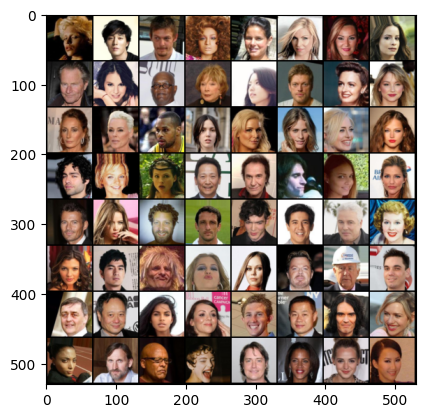

In [ ]:
show_images = next(iter(data_loader))
plt.imshow(np.transpose(vutils.make_grid(show_images[0][0:64], padding=2, normalize=True),(1,2,0)))

In [ ]:
show_images[1][0:64]

tensor([[0., 0.],
        [1., 1.],
        [1., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [1., 0.],
        [0., 1.],
        [1., 0.],
        [0., 0.],
        [0., 0.],
        [1., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [1., 0.],
        [0., 1.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [1., 1.],
        [0., 0.],
        [0., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [0., 0.],
        [0., 0.],
        [1., 1.],
        [0., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 1.],
        [1., 0.],
        [0., 0.],
        [0., 1.],
        [1., 1.],
        [1., 0.],
        [0., 0.],
        [0., 0.],
        [1., 0.],
        [1., 0.],
        [1., 1.],
        [1., 0.],
        [1., 0.],
        [0., 0.],
        [0., 0.],
        [1., 0.],
        [1., 1.],
        [1., 1.],
        [0

In [ ]:
# Create the Generator
netG = Generator().to(device)
print(netG)

# Create the Discriminator
netD = Discriminator().to(device)
print(netD)

Generator(
  (deconv1_1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
  (deconv1_1_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv1_2): ConvTranspose2d(4, 512, kernel_size=(4, 4), stride=(1, 1))
  (deconv1_2_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv2): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv2_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv3_bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv4): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv4_bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv5): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding

In [ ]:
# Set the cost function
cost_fun = nn.BCELoss()

real_label = 1
fake_label = 0

# Create Discriminator and Generator optimizer
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

Epoch 0/2 batch 0/3165


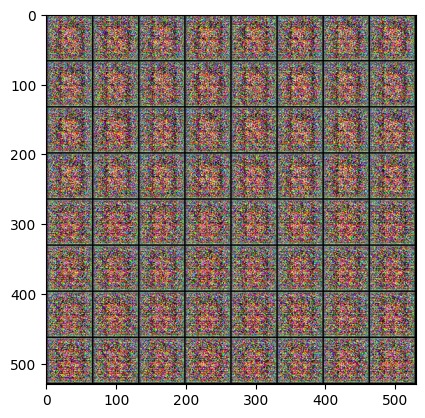

Loss_D_real: 0.49293652176856995 Loss_D_fake: 0.4724285304546356 Loss G: 0.0003983389469794929
Epoch 0/2 batch 300/3165


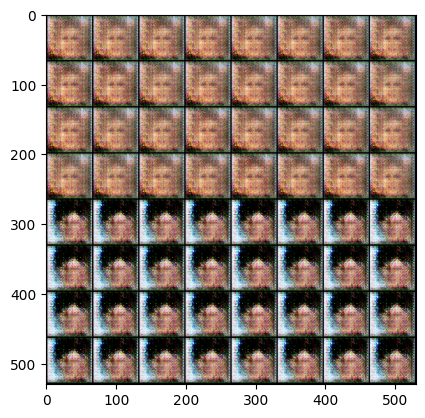

Loss_D_real: 0.9996408224105835 Loss_D_fake: 0.01302229706197977 Loss G: 0.011660808697342873
Epoch 0/2 batch 600/3165


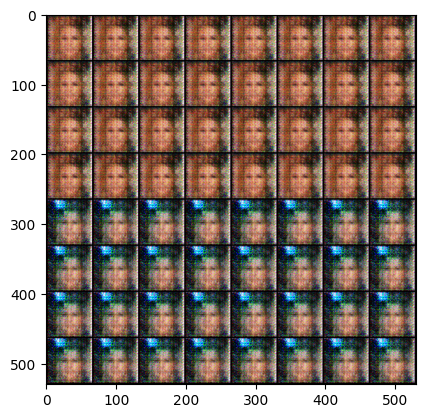

Loss_D_real: 0.8686150312423706 Loss_D_fake: 0.0005215046694502234 Loss G: 0.0004918327322229743
Epoch 0/2 batch 900/3165


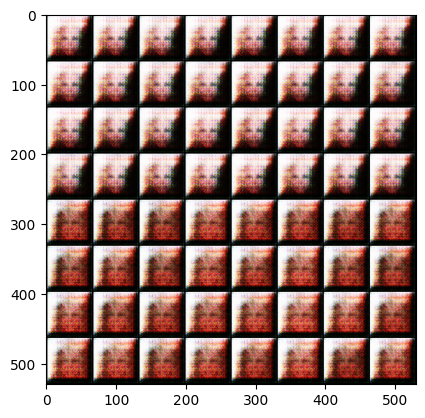

Loss_D_real: 0.9999889135360718 Loss_D_fake: 0.00013791787205263972 Loss G: 0.00014337175525724888
Epoch 0/2 batch 1200/3165


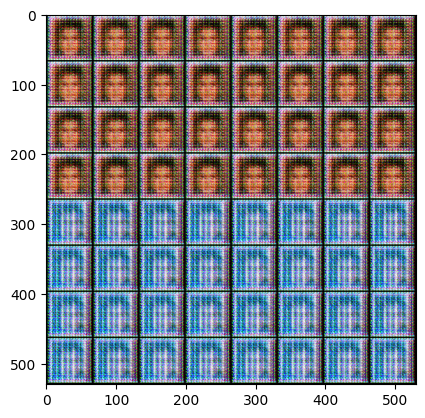

Loss_D_real: 0.9999845027923584 Loss_D_fake: 0.00031308364123106003 Loss G: 0.0003031594678759575
Epoch 0/2 batch 1500/3165


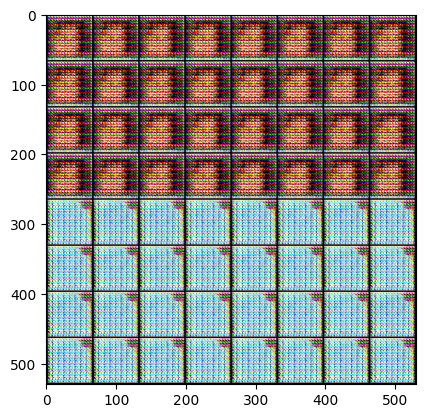

Loss_D_real: 0.9999514222145081 Loss_D_fake: 0.0011546548921614885 Loss G: 0.0011239382438361645
Epoch 0/2 batch 1800/3165


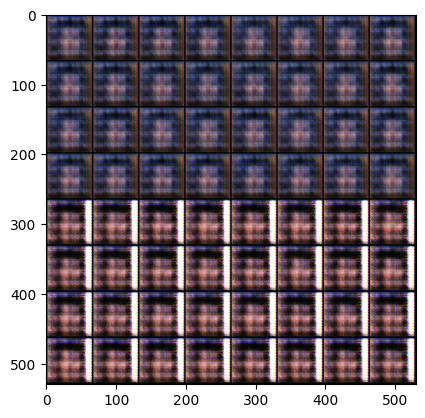

Loss_D_real: 0.9999716877937317 Loss_D_fake: 3.397389446035959e-05 Loss G: 2.4253648007288575e-05
Epoch 0/2 batch 2100/3165


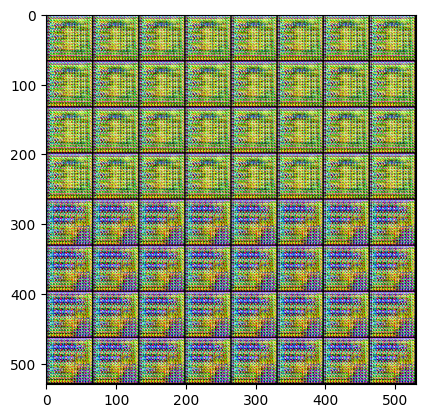

Loss_D_real: 0.9999979138374329 Loss_D_fake: 0.005923871416598558 Loss G: 0.0049187615513801575
Epoch 0/2 batch 2400/3165


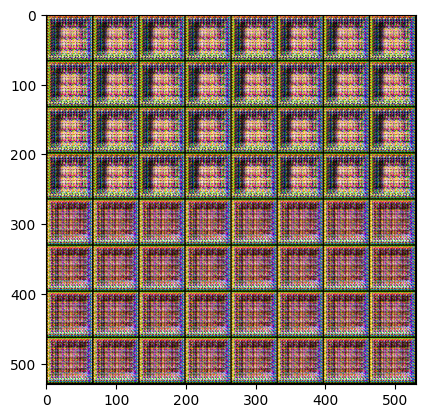

Loss_D_real: 0.9999518990516663 Loss_D_fake: 1.689895725576207e-05 Loss G: 1.7261329048778862e-05
Epoch 0/2 batch 2700/3165


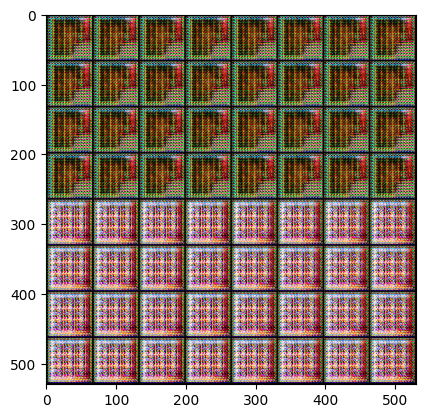

Loss_D_real: 0.9999823570251465 Loss_D_fake: 0.00042365281842648983 Loss G: 0.0004036316240672022
Epoch 0/2 batch 3000/3165


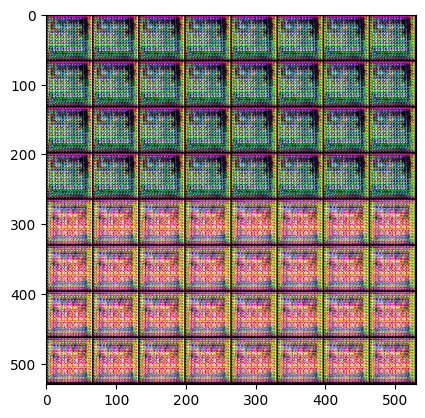

Loss_D_real: 0.9996659755706787 Loss_D_fake: 0.00029257009737193584 Loss G: 0.00028814608231186867
Epoch 1/2 batch 0/3165


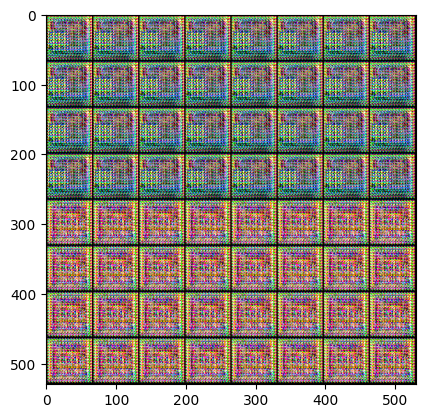

Loss_D_real: 0.9999673366546631 Loss_D_fake: 0.00025502167409285903 Loss G: 0.0002529182529542595
Epoch 1/2 batch 300/3165


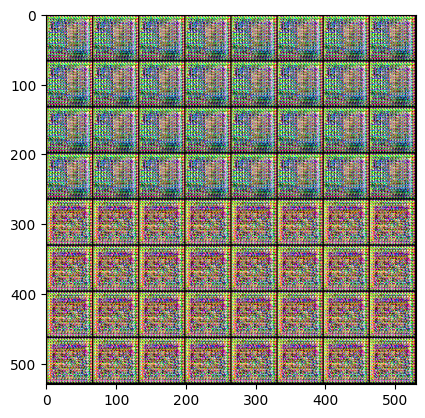

Loss_D_real: 0.9999743103981018 Loss_D_fake: 7.100134098436683e-05 Loss G: 7.071680738590658e-05
Epoch 1/2 batch 600/3165


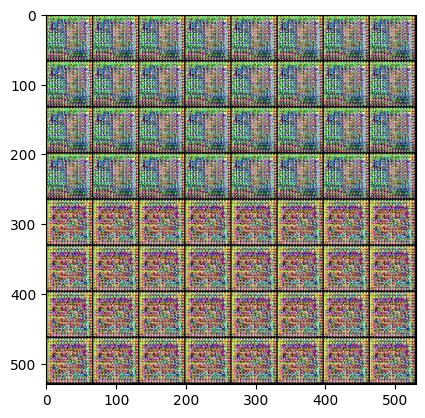

Loss_D_real: 0.9999834895133972 Loss_D_fake: 3.859943535644561e-05 Loss G: 3.850366920232773e-05
Epoch 1/2 batch 900/3165


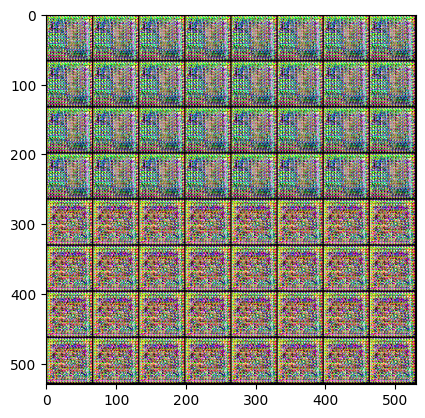

Loss_D_real: 0.9999864101409912 Loss_D_fake: 2.169236176996492e-05 Loss G: 2.1663505322067067e-05
Epoch 1/2 batch 1200/3165


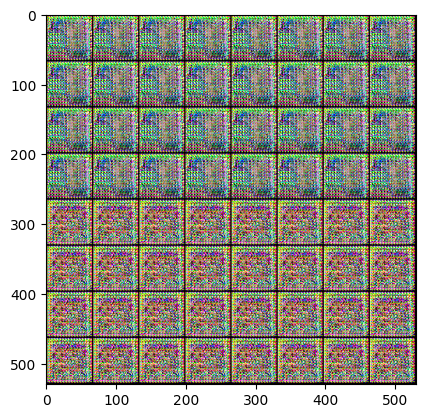

Loss_D_real: 0.9999909996986389 Loss_D_fake: 1.5537400031462312e-05 Loss G: 1.551925015519373e-05
Epoch 1/2 batch 1500/3165


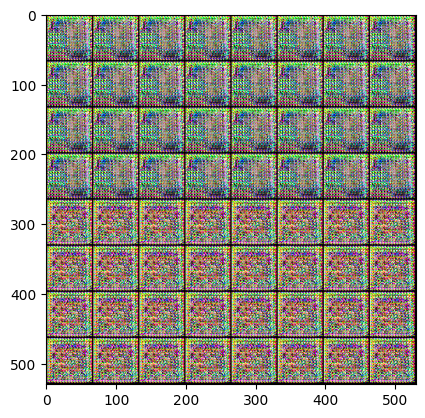

Loss_D_real: 0.9999953508377075 Loss_D_fake: 1.2248476195964031e-05 Loss G: 1.2234191672177985e-05
Epoch 1/2 batch 1800/3165


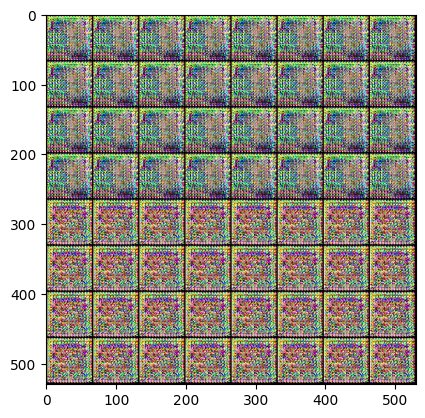

Loss_D_real: 0.9999954700469971 Loss_D_fake: 9.782026609173045e-06 Loss G: 9.770990800461732e-06
Epoch 1/2 batch 2100/3165


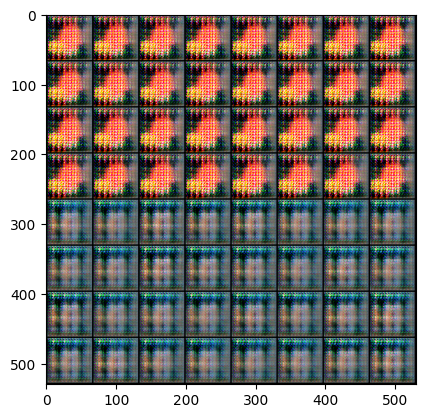

Loss_D_real: 0.9981721639633179 Loss_D_fake: 6.58183780615218e-05 Loss G: 0.00017658862634561956
Epoch 1/2 batch 2400/3165


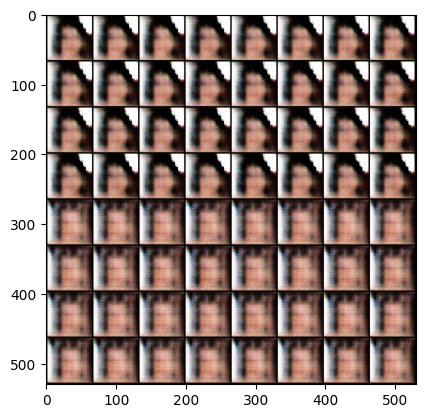

Loss_D_real: 0.6943590641021729 Loss_D_fake: 7.0320995291695e-05 Loss G: 6.130248948466033e-05
Epoch 1/2 batch 2700/3165


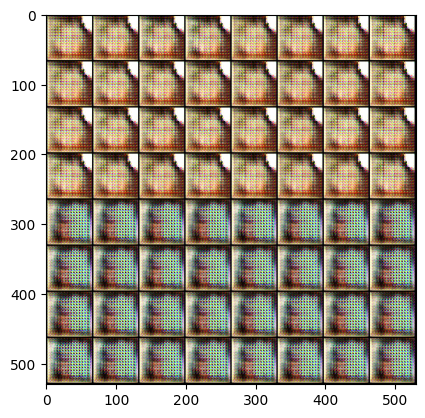

Loss_D_real: 0.7643126249313354 Loss_D_fake: 0.006218591704964638 Loss G: 0.016971077769994736
Epoch 1/2 batch 3000/3165


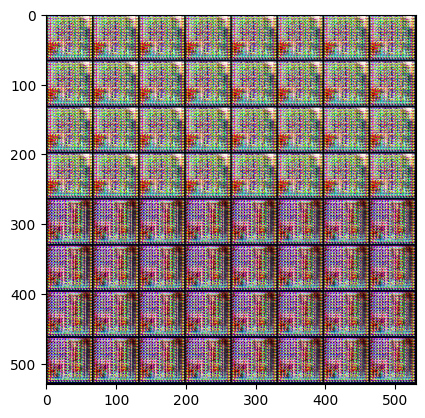

Loss_D_real: 0.8543779253959656 Loss_D_fake: 0.00014291485422290862 Loss G: 0.00031404447508975863


In [ ]:
# Start traiting
for current_epoch in range(num_epochs):

  for batch_index, (data,lbl) in enumerate(data_loader,0):
      # Encode real labels for the discriminator
      lbl_real_disc = getDiscriminatorLabels(lbl,batch_size, image_size)

      # Reset discriminator, the same as optimizerD.zero_grad()
      netD.zero_grad()
      # Train discriminator on real data
      real_data = data.to(device) #load the real data in the data variable
      lbl_real_disc = lbl_real_disc.to(device)
      # create a tensor of lenght batch size, with inside all cells the label indicating real data
      b_size = real_data.size(0)
      targets = torch.full((b_size,), real_label, device=device, dtype= torch.float32)
      # compute the output of the discriminator, that will be a number between 0 and 1 for every batch element
      outputs = netD(real_data,lbl_real_disc).view(-1)
      # Compute the loss of the discriminator
      real_loss = cost_fun(outputs,targets)
      # Backward propagation for the discriminator
      real_loss.backward()
      D_x = outputs.mean().item()

      # Get random labels (array of 1 or 0)
      fake_in_lbl_clear = np.random.randint(2, size=(batch_size,n_labels))

      # From the rangom labels get the labels for the generator
      fake_in_lbl_g = getGeneratorLabels(fake_in_lbl_clear,batch_size)
      fake_in_lbl_g = fake_in_lbl_g.to(device)

      # From the rangom labels get the labels for the discriminator
      fake_in_lbl_d = getDiscriminatorLabels(fake_in_lbl_clear,batch_size,image_size)
      fake_in_lbl_d = fake_in_lbl_d.to(device)

      ## Train with all-fake batch
      # Generate batch of latent vectors
      noise = torch.randn(b_size, g_input_dim, 1, 1, device=device)
      # Generate fake image batch with G
      fake = netG(noise,fake_in_lbl_g)
      targets.fill_(fake_label)
      # Classify all fake batch with D
      output = netD(fake.detach(),fake_in_lbl_d).view(-1)
      # Calculate D's loss on the all-fake batch
      errD_fake = cost_fun(output, targets)
      # Calculate the gradients for this batch
      errD_fake.backward()
      D_G_z1 = output.mean().item()
      # Add the gradients from the all-real and all-fake batches
      errD = errD_fake
      # Update D
      optimizerD.step()

      # Train the generator
      netG.zero_grad()
      # fake labels are real for the generator, because the objective of the discriminator
      # is to generate data that seems real, so that is labeled real
      targets.fill_(real_label)
      # Reuse fake data to make the discriminator classify again
      outputs = netD(fake,fake_in_lbl_d).view(-1)
      # The loss of the generator is the difference between the output of the discriminator and the real label
      loss_g = cost_fun(outputs,targets)
      # Generator backpropagation
      loss_g.backward()
      D_G_z2 = outputs.mean().item()
      # Generator optimizer step
      optimizerG.step()

      if batch_index % visualization_step == 0:
          print('Epoch ' + str(current_epoch) + '/' + str(num_epochs) + ' batch ' + str(batch_index) + '/' + str(len(data_loader)))

          fake_vis_label = getGeneratorVisualizationLabels(n_labels,batch_size)
          fake_vis_label = fake_vis_label.to(device)
          noise_vis = torch.randn(b_size, g_input_dim, 1, 1, device=device)
          visualFake = netG(noise_vis,fake_vis_label)
          imgplot = plt.imshow(np.transpose(vutils.make_grid(visualFake[0:64].detach().cpu(), padding=2, normalize=True),(1,2,0)))
          # plt.savefig(str(output_dir) + 'result_' + str(current_epoch) + '_' + str(batch_index) + '.png')
          plt.show()

          print('Loss_D_real: ' + str(D_x) + ' Loss_D_fake: ' + str(D_G_z1) + ' Loss G: ' + str(D_G_z2) )

          current_batch = int(current_epoch*len(data_loader) + batch_index)


In [ ]:
#save gen and des models
torch.save(netG.state_dict(), '/content/gdrive/MyDrive/gen.pth')
torch.save(netD.state_dict(), '/content/gdrive/MyDrive/des.pth')